## Abstract:
Understanding the tastes of each user and the characteristics of each
product is necessary to predict how a user will respond to a new product.
This latent user and product dimensions can be discovered with the help of
user feedback. A numeric rating and its accompanying text review is the
most widely available form of user feedback. A measure which
encapsulates the contents of such reviews is often necessary as they have
been found to significantly influence the shopping behaviour of users. A
fine-grained form of such measure that could act as perfect feedback about
the product is a star rating. The review rating prediction tries to predict a
rating corresponding to the given review.

## Problem Statement:
Given the google rating data, use a hierarchical clustering algorithm to
cluster reviews.


## Scope:
1. Analyzing the existing data and getting valuable insights about the
review pattern
2. Data pre-processing including missing value treatment
3. Cluster the reviews based on the optimum number of clusters (‘k’)
with the help of dendrogram


## Importing libraries and Load Data

In [69]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

In [70]:
df=pd.read_csv('google_review_ratings.csv')

In [71]:
df.head()

,User,Category 1,Category 2,Category 3,Category 4,Category 5,Category 6,Category 7,Category 8,Category 9,...,Category 16,Category 17,Category 18,Category 19,Category 20,Category 21,Category 22,Category 23,Category 24,Unnamed: 25
0,User 1,0.0,0.0,3.63,3.65,5.0,2.92,5.0,2.35,2.33,...,0.59,0.5,0.0,0.5,0.0,0.0,0.0,0.0,0.0,NaN
1,User 2,0.0,0.0,3.63,3.65,5.0,2.92,5.0,2.64,2.33,...,0.59,0.5,0.0,0.5,0.0,0.0,0.0,0.0,0.0,NaN
2,User 3,0.0,0.0,3.63,3.63,5.0,2.92,5.0,2.64,2.33,...,0.59,0.5,0.0,0.5,0.0,0.0,0.0,0.0,0.0,NaN
3,User 4,0.0,0.5,3.63,3.63,5.0,2.92,5.0,2.35,2.33,...,0.59,0.5,0.0,0.5,0.0,0.0,0.0,0.0,0.0,NaN
4,User 5,0.0,0.0,3.63,3.63,5.0,2.92,5.0,2.64,2.33,...,0.59,0.5,0.0,0.5,0.0,0.0,0.0,0.0,0.0,NaN


In [72]:
df.shape

(5456, 26)

In [73]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5456 entries, 0 to 5455
Data columns (total 26 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   User         5456 non-null   object 
 1   Category 1   5456 non-null   float64
 2   Category 2   5456 non-null   float64
 3   Category 3   5456 non-null   float64
 4   Category 4   5456 non-null   float64
 5   Category 5   5456 non-null   float64
 6   Category 6   5456 non-null   float64
 7   Category 7   5456 non-null   float64
 8   Category 8   5456 non-null   float64
 9   Category 9   5456 non-null   float64
 10  Category 10  5456 non-null   float64
 11  Category 11  5456 non-null   object 
 12  Category 12  5455 non-null   float64
 13  Category 13  5456 non-null   float64
 14  Category 14  5456 non-null   float64
 15  Category 15  5456 non-null   float64
 16  Category 16  5456 non-null   float64
 17  Category 17  5456 non-null   float64
 18  Category 18  5456 non-null   float64
 19  Catego

In [74]:
df['Category 11'].unique()

array(['1.7', '1.73', '1.71', '1.69', '1.67', '1.65', '1.66', '1.64',
       '1.63', '5', '1.56', '1.55', '1.53', '1.52', '1.51', '1.5', '1.49',
       '1.48', '1.46', '2.13', '2.12', '2.1', '2.09', '2.08', '2.07',
       '2.06', '2.05', '2.04', '2.03', '2.01', '2', '1.98', '1.97',
       '1.95', '1.93', '1.91', '1.9', '1.88', '1.86', '1.84', '1.83',
       '1.81', '1.79', '1.77', '1.74', '1.72', '1.68', '1.61', '1.6',
       '1.59', '1.58', '1.99', '2.47', '2.35', '2.48', '2.59', '3.39',
       '2.31', '2.78', '2.79', '2.77', '2.76', '2.75', '2.74', '2.72',
       '2.71', '2.69', '2.68', '2.66', '2.65', '2.63', '2.61', '2.57',
       '2.55', '2.53', '2.51', '2.49', '1.94', '1.92', '1.82', '1.76',
       '1.62', '4.08', '4.04', '4.02', '4.01', '4', '3.99', '3.98',
       '3.96', '3.95', '3.94', '3.93', '3.91', '3.9', '3.88', '3.87',
       '3.86', '3.84', '3.85', '2.17', '3', '2.99', '2.82', '2.83',
       '2.81', '2.8', '2.73', '2.67', '2.64', '2.62', '2.54', '2.52',
       '2.5', '2.

In [75]:
df[df['Category 11']=='2\t2.']

,User,Category 1,Category 2,Category 3,Category 4,Category 5,Category 6,Category 7,Category 8,Category 9,...,Category 16,Category 17,Category 18,Category 19,Category 20,Category 21,Category 22,Category 23,Category 24,Unnamed: 25
2712,User 2713,1.71,1.68,1.46,1.13,1.12,1.15,1.26,1.17,1.59,...,1.08,1.1,1.04,5.0,4.43,5.0,5.0,5.0,2.57,2.58


In [76]:
df["Category 11"] = pd.to_numeric(df["Category 11"], errors= 'coerce')
df['Category 11'].head()

0    1.70
1    1.70
2    1.70
3    1.73
4    1.70
Name: Category 11, dtype: float64

In [77]:
df.isnull().sum()

User              0
Category 1        0
Category 2        0
Category 3        0
Category 4        0
Category 5        0
Category 6        0
Category 7        0
Category 8        0
Category 9        0
Category 10       0
Category 11       1
Category 12       1
Category 13       0
Category 14       0
Category 15       0
Category 16       0
Category 17       0
Category 18       0
Category 19       0
Category 20       0
Category 21       0
Category 22       0
Category 23       0
Category 24       1
Unnamed: 25    5454
dtype: int64

In [78]:
df.drop(df[['User','Unnamed: 25']],axis=1,inplace=True)

In [79]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5456 entries, 0 to 5455
Data columns (total 24 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   Category 1   5456 non-null   float64
 1   Category 2   5456 non-null   float64
 2   Category 3   5456 non-null   float64
 3   Category 4   5456 non-null   float64
 4   Category 5   5456 non-null   float64
 5   Category 6   5456 non-null   float64
 6   Category 7   5456 non-null   float64
 7   Category 8   5456 non-null   float64
 8   Category 9   5456 non-null   float64
 9   Category 10  5456 non-null   float64
 10  Category 11  5455 non-null   float64
 11  Category 12  5455 non-null   float64
 12  Category 13  5456 non-null   float64
 13  Category 14  5456 non-null   float64
 14  Category 15  5456 non-null   float64
 15  Category 16  5456 non-null   float64
 16  Category 17  5456 non-null   float64
 17  Category 18  5456 non-null   float64
 18  Category 19  5456 non-null   float64
 19  Catego

In [80]:
df['Category 11'].fillna(df['Category 11'].mean(),inplace=True)
df['Category 12'].fillna(df['Category 12'].mean(),inplace=True)
df['Category 24'].fillna(df['Category 24'].mean(),inplace=True)

In [81]:
df.isnull().sum().sum()

0

In [82]:
column_names = ['churches', 'resorts', 'beaches', 'parks','theatres', 'museums', 'malls', 'zoo', 'restaurants', 
                'pubs_bars', 'local_services', 'burger_pizza_shops', 
                'hotels_other_lodgings', 'juice_bars', 'art_galleries', 
                'dance_clubs', 'swimming_pools', 'gyms', 'bakeries', 
                'beauty_spas', 'cafes', 'view_points', 'monuments', 'gardens']

In [83]:
df.columns = column_names

In [84]:
df.columns

Index(['churches', 'resorts', 'beaches', 'parks', 'theatres', 'museums',
       'malls', 'zoo', 'restaurants', 'pubs_bars', 'local_services',
       'burger_pizza_shops', 'hotels_other_lodgings', 'juice_bars',
       'art_galleries', 'dance_clubs', 'swimming_pools', 'gyms', 'bakeries',
       'beauty_spas', 'cafes', 'view_points', 'monuments', 'gardens'],
      dtype='object')

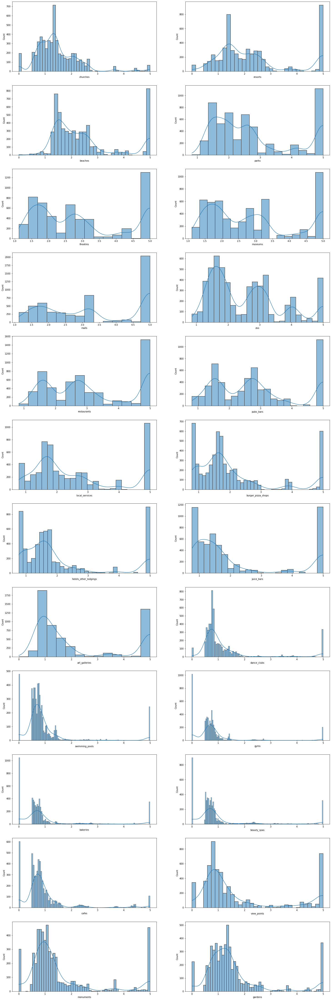

In [85]:
plt.figure(figsize=(25,80))
i=1
for k in df.columns:
    if  i<25:
        plt.subplot(12,2,i)
        sns.histplot(x=k,data=df,kde=True,palette='gnuplot')
        i+=1

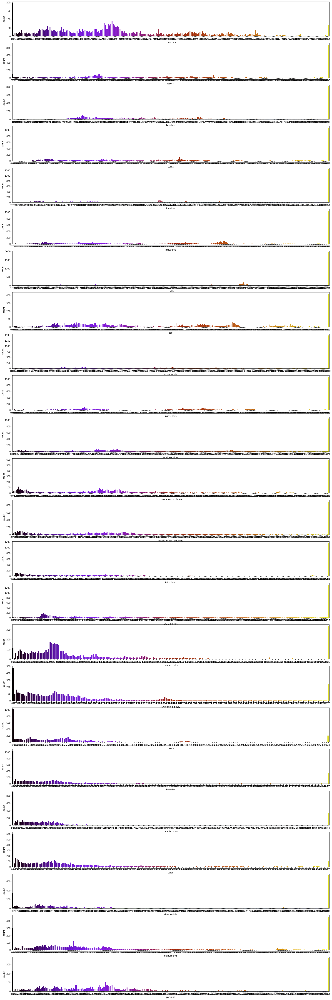

In [119]:
plt.figure(figsize=(25,80))
i=1
for k in df.columns:
    if  i<25:
        plt.subplot(24,1,i)
        sns.countplot(x=k,data=df,palette='gnuplot')
        i+=1

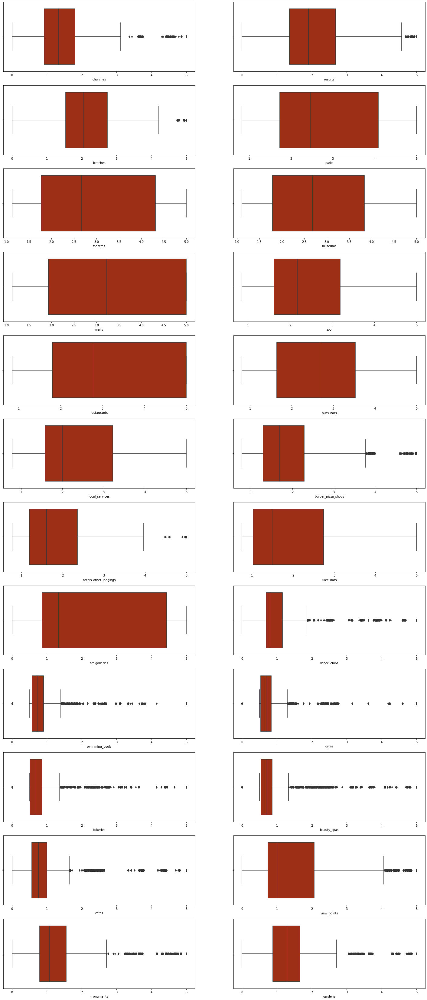

In [86]:
plt.figure(figsize=(25,60))
i=1
for k in df.columns:
    if  i<25:
        plt.subplot(12,2,i)
        sns.boxplot(x=k,data=df,palette='gnuplot')
        i+=1

In [120]:
reviews = df[column_names[1:]].astype(bool).sum(axis=0).sort_values()
reviews

bakeries                 4410
gyms                     4439
beauty_spas              4560
cafes                    4852
swimming_pools           4977
view_points              5111
monuments                5154
gardens                  5231
dance_clubs              5344
resorts                  5366
art_galleries            5452
beaches                  5452
burger_pizza_shops       5456
pubs_bars                5456
juice_bars               5456
restaurants              5456
zoo                      5456
malls                    5456
museums                  5456
theatres                 5456
parks                    5456
local_services           5456
hotels_other_lodgings    5456
dtype: int64

Text(0.5, 1.0, 'No of reviews under each category')

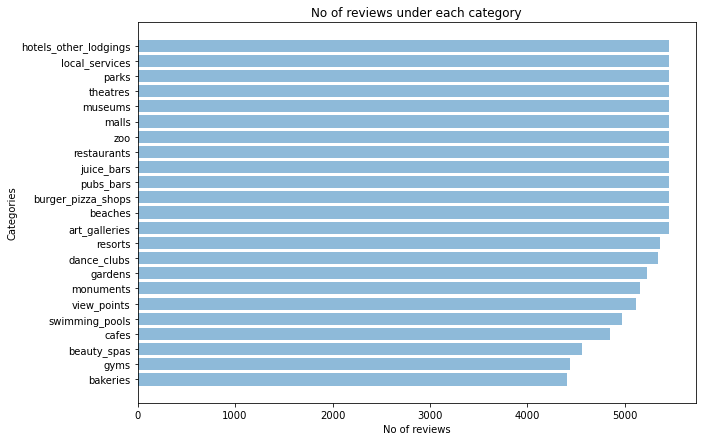

In [121]:
plt.figure(figsize=(10,7))
plt.barh(np.arange(len(column_names[1:])), reviews.values, align='center', alpha=0.5)
plt.yticks(np.arange(len(column_names[1:])), reviews.index)
plt.xlabel('No of reviews')
plt.ylabel('Categories')
plt.title('No of reviews under each category')

## Creating the Dendrogram

### Importing dendrogram and linkage module2

In [19]:
from scipy.cluster.hierarchy import dendrogram, linkage

### Choosing average linkage method

In [87]:
link_method=linkage(df,method='ward')

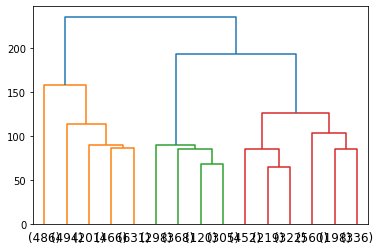

In [88]:
dend=dendrogram(link_method,truncate_mode='lastp',p=15)

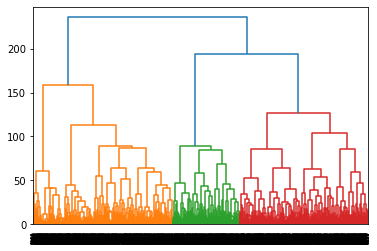

In [22]:
dend=dendrogram(link_method)

## Importing fcluster module to create clusters

### Divisibe Approach

In [23]:
from scipy.cluster.hierarchy import fcluster

In [89]:
cluster=fcluster(link_method,4,criterion='maxclust')

In [90]:
cluster

array([4, 4, 4, ..., 3, 3, 3], dtype=int32)

In [91]:
df['clusters']=cluster

In [92]:
df.head()

,churches,resorts,beaches,parks,theatres,museums,malls,zoo,restaurants,pubs_bars,...,dance_clubs,swimming_pools,gyms,bakeries,beauty_spas,cafes,view_points,monuments,gardens,clusters
0,0.0,0.0,3.63,3.65,5.0,2.92,5.0,2.35,2.33,2.64,...,0.59,0.5,0.0,0.5,0.0,0.0,0.0,0.0,0.0,4
1,0.0,0.0,3.63,3.65,5.0,2.92,5.0,2.64,2.33,2.65,...,0.59,0.5,0.0,0.5,0.0,0.0,0.0,0.0,0.0,4
2,0.0,0.0,3.63,3.63,5.0,2.92,5.0,2.64,2.33,2.64,...,0.59,0.5,0.0,0.5,0.0,0.0,0.0,0.0,0.0,4
3,0.0,0.5,3.63,3.63,5.0,2.92,5.0,2.35,2.33,2.64,...,0.59,0.5,0.0,0.5,0.0,0.0,0.0,0.0,0.0,4
4,0.0,0.0,3.63,3.63,5.0,2.92,5.0,2.64,2.33,2.64,...,0.59,0.5,0.0,0.5,0.0,0.0,0.0,0.0,0.0,4


## Cluster Profiles

In [93]:
cluster_pro=df.groupby('clusters').mean()
cluster_pro['Freq']=df['clusters'].value_counts().sort_index()

In [94]:
cluster_pro.T

clusters,1,2,3,4
churches,0.638930,1.203253,2.263153,1.440613
resorts,0.905679,2.272712,2.814207,2.430839
beaches,1.573951,2.066016,2.633969,2.990364
parks,1.555679,2.252176,2.369624,3.776996
theatres,1.564671,2.448945,2.126150,4.156881
museums,1.596193,2.931936,1.957910,3.651663
malls,2.919506,4.090670,2.041879,3.501754
zoo,1.949588,3.338158,1.599441,2.485918
restaurants,2.759712,4.264587,1.953501,2.846636
pubs_bars,2.961420,3.873326,1.550999,2.579291


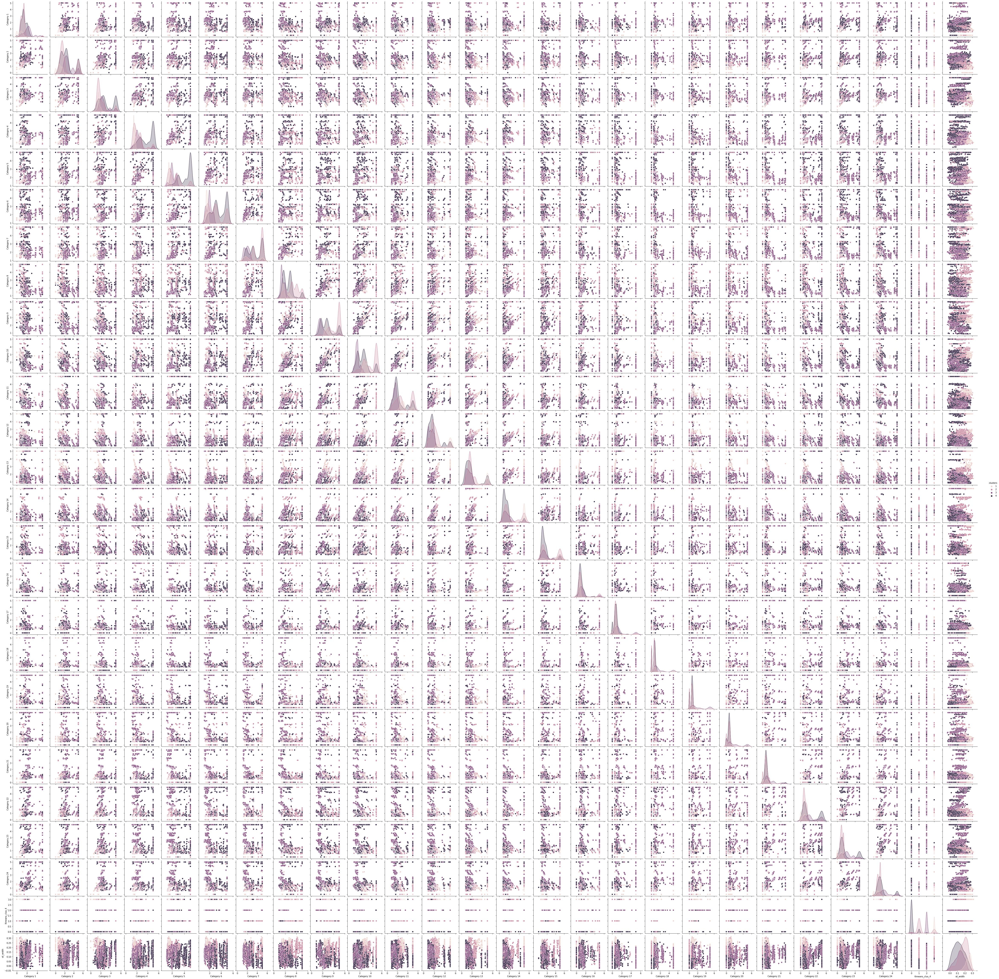

In [65]:
sns.pairplot(df,hue='clusters');
.00.000.0


# Creating Clusters using KMeans

## Calculating WSS for other values of K - Elbow Method

In [32]:
from sklearn.cluster import KMeans

In [95]:
wss=[]
for i in range(1,11):
    km=KMeans(n_clusters=i,random_state=1)
    km.fit(df)
    wss.append(km.inertia_)

In [96]:
wss

[221485.5799759552,
 186990.6366962365,
 167462.88228437697,
 152800.3879261141,
 143138.81189736378,
 135880.25976336465,
 130587.27559226687,
 126186.30816822413,
 121689.87553676989,
 117748.02988394891]

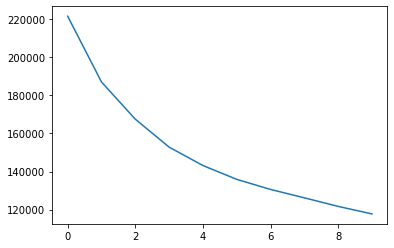

In [97]:
plt.plot(wss)

C:\Users\Dell\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


<AxesSubplot:>

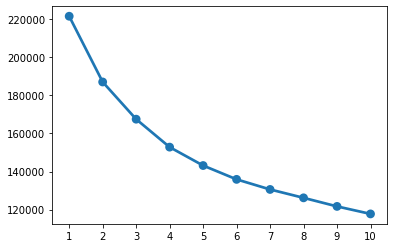

In [98]:
a=[1,2,3,4,5,6,7,8,9,10]
sns.pointplot(a,wss)

In [99]:
from sklearn.metrics import silhouette_samples, silhouette_score

In [100]:
sil_wid=silhouette_samples(df,labels2)
sil_wid

array([0.01551195, 0.01989076, 0.02007876, ..., 0.22348839, 0.17486914,
       0.22564318])

In [101]:
df['sil_width']=sil_wid

In [102]:
df['sil_width'].mean()

0.14967665945544362

# KMeans with K2

In [103]:
k_means=KMeans(n_clusters=2,random_state=1)
k_means.fit(df)
labels2=k_means.labels_

In [104]:
sil_score=silhouette_score(df,labels2,random_state=1)
sil_score

0.1496780180253738

## KMeans with K3

In [105]:
k_means=KMeans(n_clusters=3,random_state=1)
k_means.fit(df)
labels3=k_means.labels_

In [106]:
sil_score=silhouette_score(df,labels3,random_state=1)
sil_score

0.15368325628863028

# KMeans with K4

In [107]:
k_means=KMeans(n_clusters=4,random_state=1)
k_means.fit(df)
labels4=k_means.labels_

In [108]:
sil_score=silhouette_score(df,labels4,random_state=1)
sil_score

0.15330326449320336

# KMeans with K5

In [109]:
k_means=KMeans(n_clusters=5,random_state=1)
k_means.fit(df)
labels5=k_means.labels_

In [110]:
sil_score=silhouette_score(df,labels5,random_state=1)
sil_score

0.15816612078163128

In [111]:
df['Kmeans_clus_4']=labels4

In [112]:
df.head()

,churches,resorts,beaches,parks,theatres,museums,malls,zoo,restaurants,pubs_bars,...,gyms,bakeries,beauty_spas,cafes,view_points,monuments,gardens,clusters,sil_width,Kmeans_clus_4
0,0.0,0.0,3.63,3.65,5.0,2.92,5.0,2.35,2.33,2.64,...,0.0,0.5,0.0,0.0,0.0,0.0,0.0,4,0.015512,0
1,0.0,0.0,3.63,3.65,5.0,2.92,5.0,2.64,2.33,2.65,...,0.0,0.5,0.0,0.0,0.0,0.0,0.0,4,0.019891,0
2,0.0,0.0,3.63,3.63,5.0,2.92,5.0,2.64,2.33,2.64,...,0.0,0.5,0.0,0.0,0.0,0.0,0.0,4,0.020079,0
3,0.0,0.5,3.63,3.63,5.0,2.92,5.0,2.35,2.33,2.64,...,0.0,0.5,0.0,0.0,0.0,0.0,0.0,4,-0.011357,0
4,0.0,0.0,3.63,3.63,5.0,2.92,5.0,2.64,2.33,2.64,...,0.0,0.5,0.0,0.0,0.0,0.0,0.0,4,0.020079,0


### Cluster Profiling

In [113]:
df['Kmeans_clus_4'].value_counts().sort_index()

0    1920
1    1562
2    1078
3     896
Name: Kmeans_clus_4, dtype: int64

In [114]:
clust_pro=df.groupby('Kmeans_clus_4').mean()
clust_pro['Freq']=df['Kmeans_clus_4'].value_counts().sort_index()

In [145]:
clust_pro

,churches,resorts,beaches,parks,theatres,museums,malls,zoo,restaurants,pubs_bars,...,gyms,bakeries,beauty_spas,cafes,view_points,monuments,gardens,clusters,sil_width,Freq
Kmeans_clus_4,,,,,,,,,,,,,,,,,,,,,
0,1.467849,2.551776,3.151068,3.925750,4.355995,3.685406,3.395234,2.370109,2.648479,2.581245,...,0.542156,0.568135,0.668359,0.828615,2.169979,1.860104,1.745881,3.875000,0.110988,1920
1,1.174859,2.202029,1.886665,2.171370,2.356159,2.926895,4.149942,3.560083,4.531754,3.965986,...,0.498886,0.501223,0.622766,0.683406,1.075787,0.989673,1.099385,2.291933,0.174013,1562
2,2.264935,2.760473,2.624323,2.409341,2.111067,1.924638,1.986224,1.569443,1.912430,1.592477,...,1.755891,2.325241,2.199481,1.806642,2.744276,2.366419,2.460334,3.049165,0.135467,1078
3,0.945770,1.497266,1.959542,1.934621,2.036183,2.303940,3.507812,2.298281,3.158795,2.888192,...,0.863884,1.016685,0.925603,0.740658,0.832433,0.767121,0.886060,1.544643,0.207250,896


In [157]:
row_index = 0  # the index of the row you want to filter

# Filter the row to select values that are greater than 3
filtered_row_values = clust_pro.iloc[row_index][clust_pro.iloc[row_index] > 3]

# Print the filtered row values
print(filtered_row_values)

beaches        3.151068
parks          3.925750
theatres       4.355995
museums        3.685406
malls          3.395234
clusters       3.875000
Freq        1920.000000
Name: 0, dtype: float64


In [158]:
row_index = 1  # the index of the row you want to filter

# Filter the row to select values that are greater than 3
filtered_row_values = clust_pro.iloc[row_index][clust_pro.iloc[row_index] > 3]

# Print the filtered row values
print(filtered_row_values)

malls                4.149942
zoo                  3.560083
restaurants          4.531754
pubs_bars            3.965986
local_services       3.307548
Freq              1562.000000
Name: 1, dtype: float64


In [160]:
row_index = 2  # the index of the row you want to filter

# Filter the row to select values that are greater than 3
filtered_row_values = clust_pro.iloc[row_index][clust_pro.iloc[row_index] > 3]

# Print the filtered row values
print(filtered_row_values)

clusters       3.049165
Freq        1078.000000
Name: 2, dtype: float64


In [159]:
row_index = 3  # the index of the row you want to filter

# Filter the row to select values that are greater than 3
filtered_row_values = clust_pro.iloc[row_index][clust_pro.iloc[row_index] > 3]

# Print the filtered row values
print(filtered_row_values)

malls                      3.507812
restaurants                3.158795
burger_pizza_shops         3.359051
hotels_other_lodgings      3.821685
juice_bars                 4.762266
art_galleries              4.162757
Freq                     896.000000
Name: 3, dtype: float64


In [161]:
row_index = 0  # the index of the row you want to filter

# Filter the row to select values that are less than 1
filtered_row_values = clust_pro.iloc[row_index][clust_pro.iloc[row_index] < 1]

# Print the filtered row values
print(filtered_row_values)

swimming_pools    0.731505
gyms              0.542156
bakeries          0.568135
beauty_spas       0.668359
cafes             0.828615
sil_width         0.110988
Name: 0, dtype: float64


In [162]:
row_index = 1  # the index of the row you want to filter

# Filter the row to select values that are less than 1
filtered_row_values = clust_pro.iloc[row_index][clust_pro.iloc[row_index] < 1]

# Print the filtered row values
print(filtered_row_values)

swimming_pools    0.652260
gyms              0.498886
bakeries          0.501223
beauty_spas       0.622766
cafes             0.683406
monuments         0.989673
sil_width         0.174013
Name: 1, dtype: float64


In [163]:
row_index = 2  # the index of the row you want to filter

# Filter the row to select values that are less than 1
filtered_row_values = clust_pro.iloc[row_index][clust_pro.iloc[row_index] < 1]

# Print the filtered row values
print(filtered_row_values)

sil_width    0.135467
Name: 2, dtype: float64


In [164]:
row_index = 3  # the index of the row you want to filter

# Filter the row to select values that are less than 1
filtered_row_values = clust_pro.iloc[row_index][clust_pro.iloc[row_index] < 1]

# Print the filtered row values
print(filtered_row_values)

churches       0.945770
gyms           0.863884
beauty_spas    0.925603
cafes          0.740658
view_points    0.832433
monuments      0.767121
gardens        0.886060
sil_width      0.207250
Name: 3, dtype: float64


In [153]:
rating3=[]
i=1
for k in clust_pro.columns:
    if k>3.0 and i<25:
        print(k)
        ratings3=ratings3.append(k)
        i=i+1

TypeError: '>' not supported between instances of 'str' and 'float'

## Recomendation

<AxesSubplot:xlabel='malls', ylabel='restaurants'>

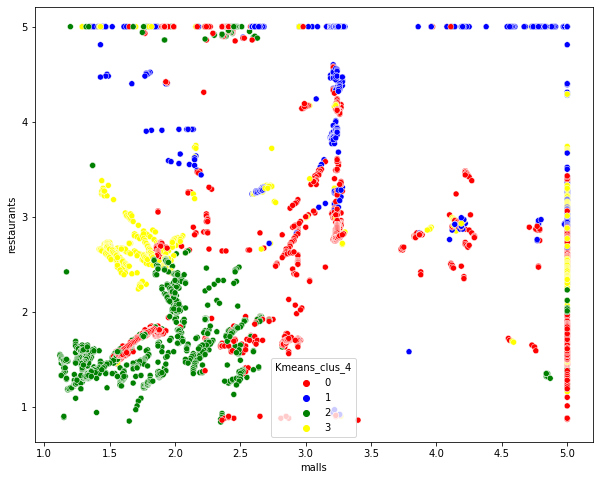

In [122]:
plt.figure(figsize=(10,8))
color=['red','blue','green','yellow']
sns.scatterplot(x='malls',y='restaurants',data=df,hue='Kmeans_clus_4',palette=color)

In [ ]:
clust_pro